----

\begin{itemize}
\item Render image color given spectral information
\item Find hyperspectral image databases
\item Demonstrate how color changes under varying illumination
\end{itemize}

In [345]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter
from matplotlib import patches as patch
import scipy.io
import os
from tqdm import tqdm
import cv2

## Loading Datasets

In [4]:
os.chdir('G:\\My Drive\\MS Physics\\2.2\Physics-301\\Database')

### Illuminants

In [349]:
CIE_A = np.loadtxt("CIE_A")
CIE_D65 = np.loadtxt("CIE_D65")
Flourescent = np.loadtxt("Flourescent")
wavelength = np.arange(400,700,.5)

In [350]:
cie = np.loadtxt("CIE1964.txt")
x_ = np.interp(wavelength, cie[:,0], cie[:,1])
y_ = np.interp(wavelength, cie[:,0], cie[:,2])
z_ = np.interp(wavelength, cie[:,0], cie[:,3])

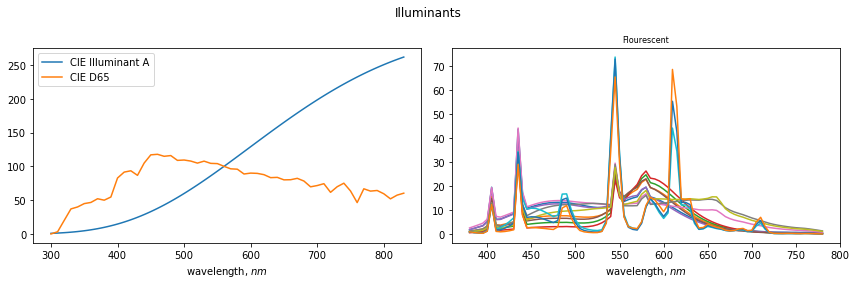

In [358]:
plt.rcParams.update({'font.size': 10})

fig, ax = plt.subplots(1,2, figsize=(12,4))
ax[0].plot(CIE_A[:,0], CIE_A[:,1], label = "CIE Illuminant A")
ax[0].plot(CIE_D65[:,0], CIE_D65[:,1], label = "CIE D65")
ax[0].set_xlabel("wavelength, $nm$")
ax[0].legend()

ax[1].plot(Flourescent[:,0], Flourescent[:,1:])
ax[1].set_xlabel("wavelength, $nm$")
ax[1].set_title("Flourescent", fontsize = 8)

plt.suptitle("Illuminants")
plt.tight_layout()

### Spectral Reflectances

In [359]:
'Loading Macbeth dataset'

macbeth = np.loadtxt("macbeth.txt")
macbeth_wav, macbeth_ref =  macbeth[4:64,0], macbeth[4:64,1:]
macbeth_r = np.zeros(shape=[len(wavelength),24])

for i in range(1,25):
    macbeth_r[:,i-1] = np.interp(wavelength, macbeth_wav, macbeth_ref[:,i-1])


### Camera Spectral Sensitivity

In [360]:
'Loading Canon 400D Spectral Sensitivity'
Canon_400D = np.loadtxt("CANON_400D")
Canon_wav, Canon_channels =  Canon_400D[:,0], Canon_400D[:,1:]

### Interpolating the datasets

In [361]:
'Interpolating the illuminants'
D65 = np.interp(wavelength, CIE_D65[:,0], CIE_D65[:,1])
Illum_A = np.interp(wavelength, CIE_A[:,0], CIE_A[:,1])

flourescent = np.zeros(shape=[len(wavelength),Flourescent.shape[1]])
for i in range(1,Flourescent.shape[1]):
    flourescent[:, i-1] = np.interp(wavelength, Flourescent[:,0], Flourescent[:,i-1])

'Interpolating the sensitivity'

Canon_red = np.interp(wavelength, Canon_wav, Canon_channels[:,0])
Canon_green = np.interp(wavelength, Canon_wav, Canon_channels[:,1])
Canon_blue = np.interp(wavelength, Canon_wav, Canon_channels[:,2])

## Spectral Trinity of Color

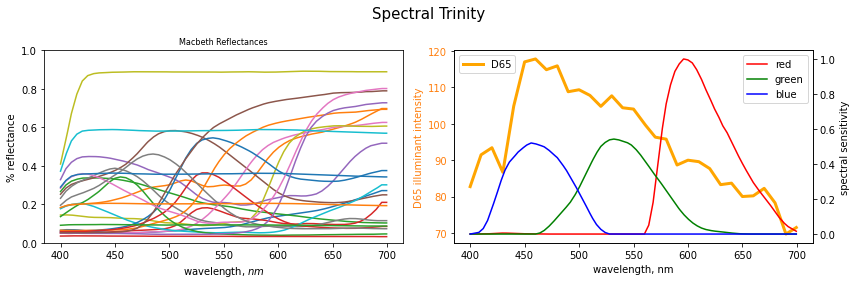

In [362]:
fig, ax = plt.subplots(1,2, figsize=[12,4])

plt.suptitle("Spectral Trinity", fontsize = 15)

ax[0].plot(wavelength, macbeth_r)
ax[0].set_title("Macbeth Reflectances")
ax[0].set_xlabel("wavelength, $nm$")
ax[0].set_ylabel("% reflectance")
ax[0].set_ylim(0,1)

color = 'tab:orange'
ax[1].plot(wavelength, D65, label = "D65", color = 'orange', lw = 3)
# ax[1].set_title("Macbeth Reflectances")
ax[1].set_xlabel("wavelength, nm")
ax[1].set_ylabel("D65 illuminant intensity", color = color)
ax[1].legend(loc = 2)
ax[1].tick_params(axis='y', labelcolor=color)

ax2 = ax[1].twinx()
ax2.plot(wavelength, Canon_red, 'r', label = "red")
ax2.plot(wavelength, Canon_green, 'g', label = "green")
ax2.plot(wavelength, Canon_blue, 'b',  label = "blue")
ax2.set_ylabel("spectral sensitivity")
ax2.legend()
# ax[1].set_ylim(0,1)
# plt.savefig("Reflectances.png", bbox_inches='tight')
plt.tight_layout()

# Spectral Imaging

## Color Simulation

In [367]:
def Color_Simulation(r_sensitivity,g_sensitivity,b_sensitivity, source, transmittance):

#     plt.figure(figsize=[30,18])
    plt.rcParams.update({'font.size': 6})

    fig, axes = plt.subplots(4,6, figsize=(8,5), sharex=True, sharey=True, dpi=150)
    
    R_m_w = np.trapz(macbeth_r[:,18]*r_sensitivity*source)
    G_m_w = np.trapz(macbeth_r[:,18]*g_sensitivity*source)
    B_m_w = np.trapz(macbeth_r[:,18]*b_sensitivity*source)
    
    R_w = np.trapz(macbeth_r[:,18]*r_sensitivity*1)
    G_w = np.trapz(macbeth_r[:,18]*g_sensitivity*1)
    B_w = np.trapz(macbeth_r[:,18]*b_sensitivity*1)
    
    RGB = []
    
    for i, ax in enumerate(axes.ravel()):
    
        R = 255/R_m_w*np.trapz(macbeth_r[:,i]*r_sensitivity*source*transmittance)
        G = 255/G_m_w*np.trapz(macbeth_r[:,i]*g_sensitivity*source*transmittance)
        B = 255/B_m_w*np.trapz(macbeth_r[:,i]*b_sensitivity*source*transmittance)
        
        R_ = 255/R_w*np.trapz(macbeth_r[:,i]*r_sensitivity*source*transmittance)
        G_ = 255/G_w*np.trapz(macbeth_r[:,i]*g_sensitivity*source*transmittance)
        B_ = 255/B_w*np.trapz(macbeth_r[:,i]*b_sensitivity*source*transmittance)


        if R<0: R = 0
        if G<0: G = 0
        if B<0: B = 0
        if R>255: R = 255
        if G>255: G = 255
        if B>255: B = 255

        rr,gg,bb = R/255,G/255,B/255

        ax.set_facecolor(([rr,gg,bb]))
    
        rect = patch.Rectangle((400,0),150,1,facecolor=([R_/255,G_/255,B_/255])) 
        ax.add_patch(rect)
        
        ax.plot(wavelength, macbeth_r[:,i]*r_sensitivity*source*transmittance, 'r--', label = "Red")
        ax.plot(wavelength, macbeth_r[:,i]*g_sensitivity*source*transmittance, 'g--', label = "Green")
        ax.plot(wavelength, macbeth_r[:,i]*b_sensitivity*source*transmittance, 'b--',  label = "Blue")
        ax.set_xlim(400,700)
        ax.set_ylim(0,1)
        ax.set_xticks([400,550,700])
        ax.set_xlabel('RGB = [' + str(int(R)) + 
                  ', ' + str(int(G)) + ', '
                  + str(int(B)) + ']')
        RGB.append([rr,gg,bb])
    
    legend = ax.legend(bbox_to_anchor=(0.3,0.3), fancybox = True)
    frame = legend.get_frame() #sets up for color, edge, and transparency
    frame.set_facecolor('#b4aeae') #color of legend
    frame.set_edgecolor('black') #edge color of legend
    frame.set_alpha(1) #deals with transparency
    
    plt.tight_layout()

### D65 Illuminant

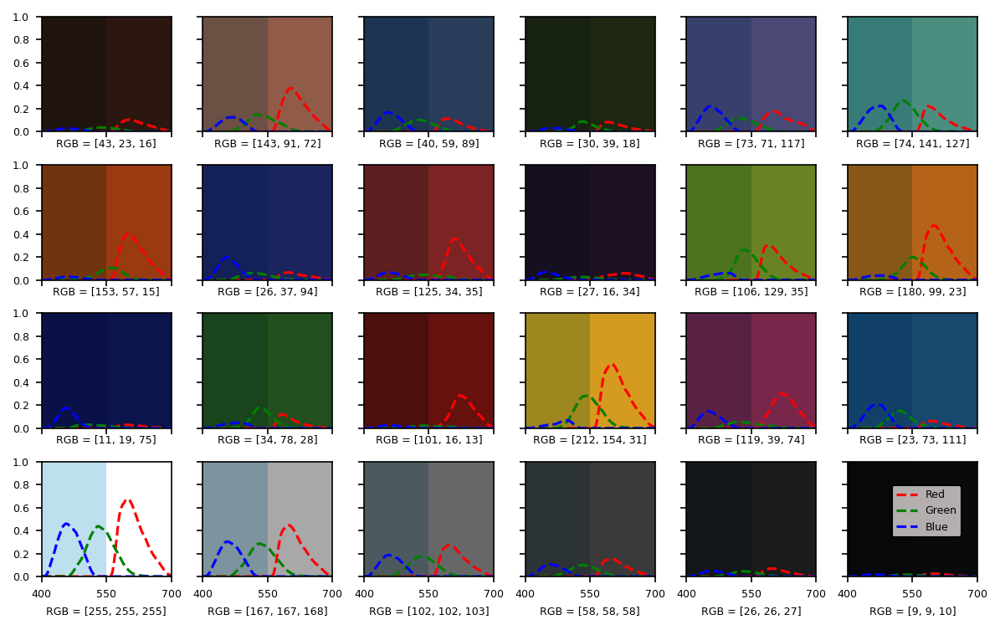

In [369]:
Color_Simulation(Canon_red,Canon_green,Canon_blue, D65/D65.max(), 1)

### Illuminant A

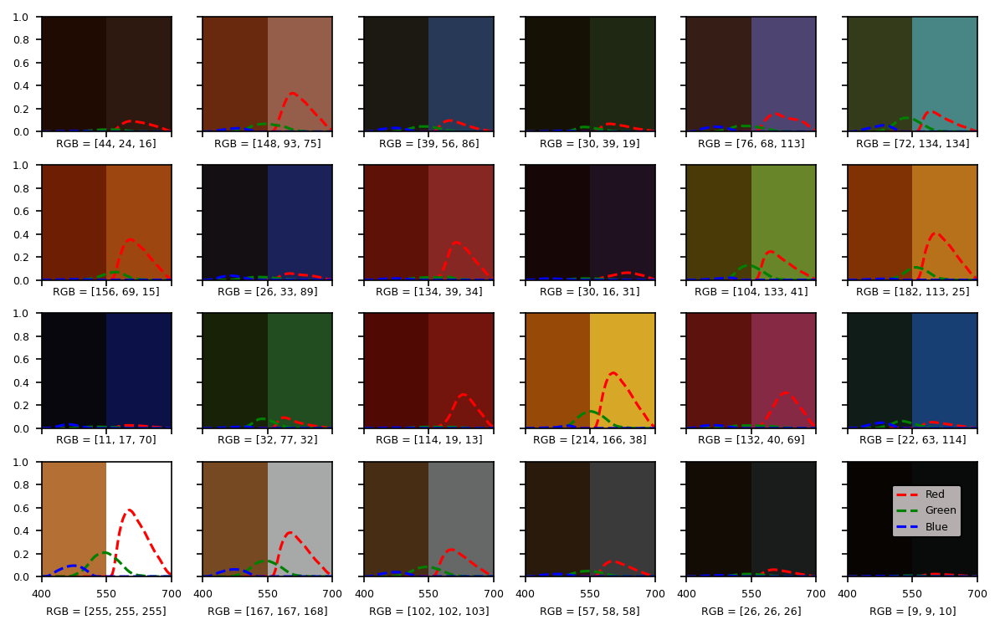

In [370]:
Color_Simulation(Canon_red,Canon_green,Canon_blue, Illum_A/Illum_A.max(), 1)

## Comparison of rendered colors

### $\Delta E_{76}$: Color Difference Metric

In [371]:
def f(t):
    if t > (6/29)**3:
        return t**(1/3)
    else:
        return (((29/6)**2)/3)*t + 4/29
    
def CIELab(spectrum):

    X_n = np.trapz(D65*x_)
    Y_n = np.trapz(D65*y_)
    Z_n = np.trapz(D65*z_)
    
    X = np.trapz(spectrum*D65*x_)
    Y = np.trapz(spectrum*D65*y_)
    Z = np.trapz(spectrum*D65*z_)
        
    L = 116*f(Y/Y_n)-16
    a = 500*(f(X/X_n)-f(Y/Y_n))
    b = 200*(f(Y/Y_n)-f(Z/Z_n))

    return L,a,b

def del_E(LAB_1,LAB_2):
    d_e = np.sqrt((LAB_1[0]-LAB_2[0])**2 + (LAB_1[1]-LAB_2[1])**2 + (LAB_1[2]-LAB_2[2])**2)
    return d_e

In [15]:
def Comparison(r_sensitivity,g_sensitivity,b_sensitivity, source1, source2, transmittance, title):

    fig, axes = plt.subplots(4,6, figsize=(8,5), sharex=True, sharey=True, dpi=150)
    
    left, bottom, width, height = [0.125,0.9, 0.11, 0.1]
    ax0 = fig.add_axes([left, bottom, width, height])
    ax0.plot(wavelength, source1, 'r-', lw = 1, label = 'Source 1' )
    ax0.plot(wavelength, source2, 'b-', lw = 1, label = 'Source 2')
    ax0.set_title("Illuminants", fontsize = 5)
    ax0.set_xticks([0])

    plt.suptitle(str(title))

    R_m_w = np.trapz(macbeth_r[:,18]*r_sensitivity*1)
    G_m_w = np.trapz(macbeth_r[:,18]*g_sensitivity*1)
    B_m_w = np.trapz(macbeth_r[:,18]*b_sensitivity*1)
    
    R_m_w1 = np.trapz(macbeth_r[:,18]*r_sensitivity*source1)
    G_m_w1 = np.trapz(macbeth_r[:,18]*g_sensitivity*source1)
    B_m_w1 = np.trapz(macbeth_r[:,18]*b_sensitivity*source1)
    
    R_m_w2 = np.trapz(macbeth_r[:,18]*r_sensitivity*source2)
    G_m_w2 = np.trapz(macbeth_r[:,18]*g_sensitivity*source2)
    B_m_w2 = np.trapz(macbeth_r[:,18]*b_sensitivity*source2)
    
    RGB = []
    
    for i, ax in enumerate(axes.ravel()):
        
        de_76 = del_E(CIELab(macbeth_r[:,i]*source1),CIELab(macbeth_r[:,i]*source2))

        R1_ = 255/R_m_w*np.trapz(macbeth_r[:,i]*r_sensitivity*source1*transmittance)
        G1_ = 255/G_m_w*np.trapz(macbeth_r[:,i]*g_sensitivity*source1*transmittance)
        B1_ = 255/B_m_w*np.trapz(macbeth_r[:,i]*b_sensitivity*source1*transmittance)
        
        R2_ = 255/R_m_w*np.trapz(macbeth_r[:,i]*r_sensitivity*source2*transmittance)
        G2_ = 255/G_m_w*np.trapz(macbeth_r[:,i]*g_sensitivity*source2*transmittance)
        B2_ = 255/B_m_w*np.trapz(macbeth_r[:,i]*b_sensitivity*source2*transmittance)
        
        
        R1 = 255/R_m_w1*np.trapz(macbeth_r[:,i]*r_sensitivity*source1*transmittance)
        G1 = 255/G_m_w1*np.trapz(macbeth_r[:,i]*g_sensitivity*source1*transmittance)
        B1 = 255/B_m_w1*np.trapz(macbeth_r[:,i]*b_sensitivity*source1*transmittance)

        R2 = 255/R_m_w2*np.trapz(macbeth_r[:,i]*r_sensitivity*source2*transmittance)
        G2 = 255/G_m_w2*np.trapz(macbeth_r[:,i]*g_sensitivity*source2*transmittance)
        B2 = 255/B_m_w2*np.trapz(macbeth_r[:,i]*b_sensitivity*source2*transmittance)

    
            
        rr1,gg1,bb1 = R1/255,G1/255,B1/255
        rr2,gg2,bb2 = R2/255,G2/255,B2/255

        ax.set_facecolor(([rr1,gg1,bb1]))
        rect = patch.Rectangle((550,0),150,0.5,facecolor=([rr2,gg2,bb2])) 
        ax.add_patch(rect)

        rect1_ = patch.Rectangle((400,0.5),150,0.5,facecolor=([R1_/255, G1_/255,  B1_/255])) 
        ax.add_patch(rect1_)
        rect2_ = patch.Rectangle((400,0),150,0.5,facecolor=([R2_/255, G2_/255,  B2_/255]))
        ax.add_patch(rect2_)
        
        rect3 = patch.Rectangle((401,0.51),299,0.49,linewidth=2,edgecolor='r',facecolor='none')
        ax.add_patch(rect3)
        rect4 = patch.Rectangle((401,0.01),299,0.49,linewidth=2,edgecolor='b',facecolor='none')
        ax.add_patch(rect4)
        
        ax.set_xlim(400,700)
        ax.set_ylim(0,1)
        ax.set_xticks([400,550,700])
        
        ax.set_xlabel("$\Delta$E$_{76}$ = " + str(np.round(de_76,2)))
        
    legend = ax0.legend(bbox_to_anchor=(1,0.8), fancybox = True)
    frame = legend.get_frame() #sets up for color, edge, and transparency
    frame.set_facecolor('#b4aeae') #color of legend
    frame.set_edgecolor('black') #edge color of legend
    frame.set_alpha(0.6) #deals with transparency
#     plt.tight_layout()


### D65 vs Illuminant A

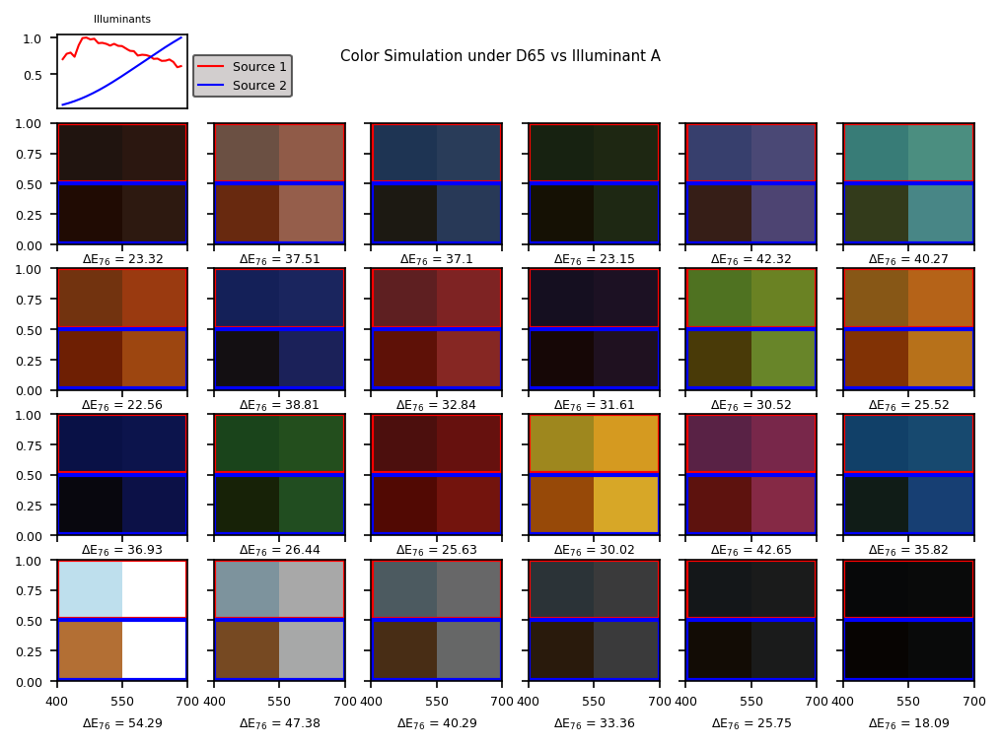

In [16]:
Comparison(Canon_red,Canon_green,Canon_blue, D65/D65.max(), Illum_A/Illum_A.max(), 1,
          title = "Color Simulation under D65 vs Illuminant A")

### Flourescent 1 vs Flourescent 11

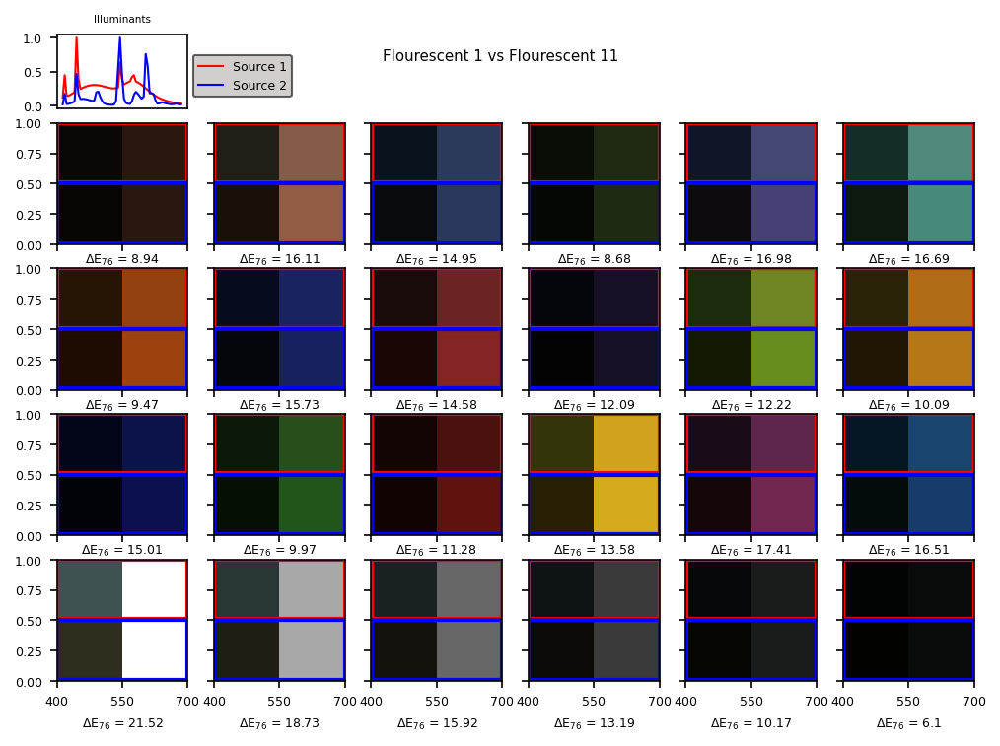

In [17]:
Comparison(Canon_red,Canon_green,Canon_blue, flourescent[:,1]/flourescent[:,1].max(), 
           flourescent[:,11]/flourescent[:,11].max(), 1,
           title = "Flourescent 1 vs Flourescent 11")

# Hyperspectral Imaging

### OS path directories

In [18]:
path = "G:\\My Drive\\Research - BS\\Dataset\\complete_ms_data\\"

In [32]:
wavelength = np.linspace(400,700, 31)

def objects(path = path):
    object  = os.listdir(path)
    #names.append()
    return object

name = objects()

def dataset_loader(datatype, imagetype):
    #datatype = "datatype"
    def loadImages(path = path +str(datatype)+"/"+ str(datatype)+"/"):

        return[os.path.join(path,f) for f in os.listdir(path) if f.endswith(imagetype)]

    filenames = loadImages()
    images = []
    for file in filenames:
        images.append(plt.imread(file))
        
    return images

def hs_dataset_loader(datatype, imagetype):
    #datatype = "datatype"
    def loadImages(path = path +str(datatype)+"/"+ str(datatype)+"/"):

        return[os.path.join(path,f) for f in os.listdir(path) if f.endswith(imagetype)]

    #if datatype == ".png":
    filenames = loadImages()
    images = np.zeros(shape=(512, 512, 31))
    for file in filenames:
        image = cv2.imread(file)
        images[:,:,filenames.index(file)] =image[:,:,0]

    return images

### Loading RGB Images

In [379]:
# plt.figure(figsize=[17.5,8])
plt.rcParams['axes.titlesize'] = 10
plt.rcParams.update({'font.size': 15})

In [375]:
INPUT = []
for i in name:
    rgb_data = dataset_loader(str(i), ".bmp")
    rgb_data = np.asarray(rgb_data)
    INPUT.append(rgb_data[0])
    
np.shape(INPUT), np.amax(INPUT)

((32, 512, 512, 3), 254)

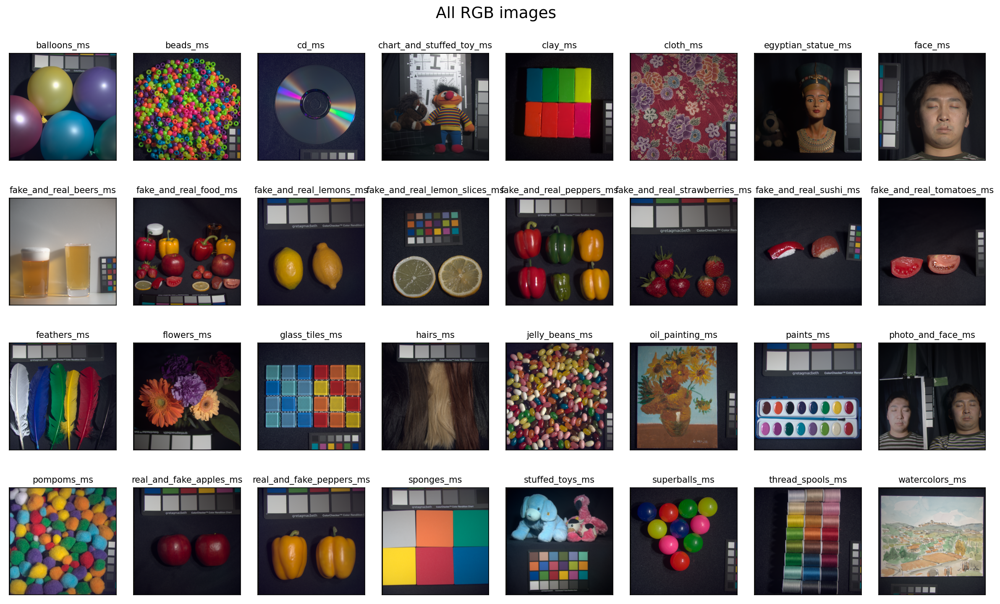

In [380]:
fig = plt.figure(figsize=[16,10], dpi = 150)

for i in range(32):
    plt.suptitle("All RGB images")
    plt.subplot(4,8,i+1)
    plt.imshow(INPUT[i])
    plt.title(name[i])
    plt.xticks([])
    plt.yticks([])
plt.tight_layout()
plt.show()

### Loading Hyperspectral Images

In [36]:
OUTPUT = np.zeros(shape=(32, 512, 512, 31))

for i in tqdm(name):
    hs_data = hs_dataset_loader(str(i), ".png")
    hs_data = np.asarray(hs_data)
    OUTPUT[name.index(i),:,:,:] = hs_data[:,:,:]

OUTPUT = OUTPUT/255

100%|██████████████████████████████████████████████████████████████████████████████████| 32/32 [15:34<00:00, 29.22s/it]


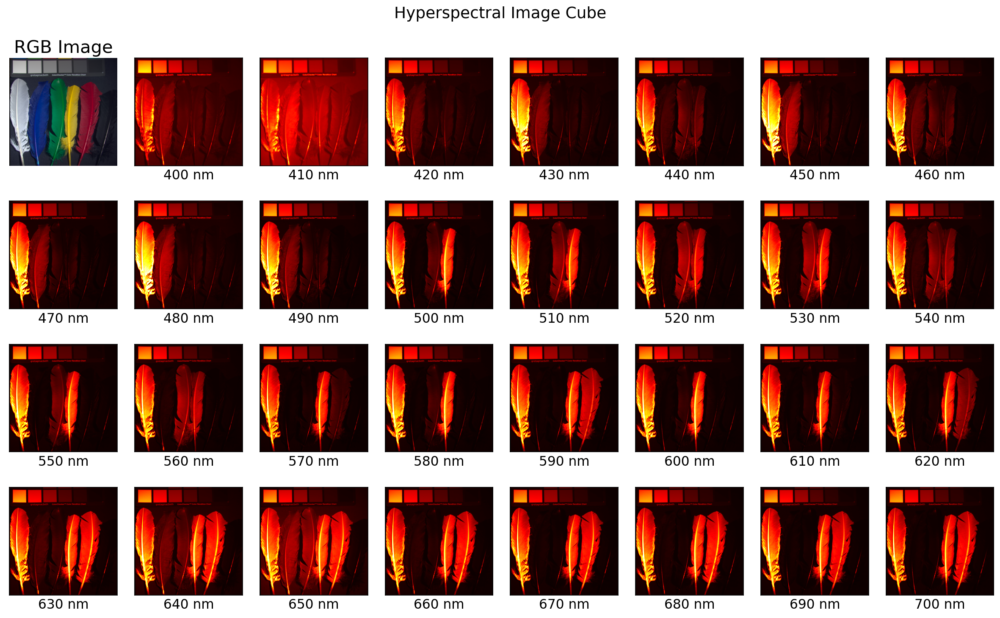

In [340]:
RGB_image = 16
fig = plt.figure(figsize=[16,10], dpi = 150)

plt.rcParams['axes.titlesize'] = 20
plt.rcParams.update({'font.size': 15})

plt.subplot(4,8,1)
plt.imshow(INPUT[RGB_image])
plt.title("RGB Image")
plt.axis("off")

for i in range(31):
    fig.suptitle("Hyperspectral Image Cube")
    plt.subplot(4,8,i+2)
    plt.imshow(OUTPUT[RGB_image,:,:,i], cmap = "hot")
    plt.xlabel(str(int(wavelength[i])) + ' nm')
    plt.xticks([])
    plt.yticks([])
    
plt.tight_layout()

### Interpolating dataset ($\Delta \lambda$ = 10 nm)

In [381]:
CAVE_wav = np.arange(400,701,10)

'CAVE DATASET Sensitivity'
path_cave = "G:\\My Drive\\Research - BS\\Dataset\\"

CAVE_red = np.loadtxt(path_cave + "CAVE_RED.txt")
CAVE_green = np.loadtxt(path_cave + "CAVE_GREEN.txt")
CAVE_blue = np.loadtxt(path_cave + "CAVE_BLUE.txt")

CAVE_red = np.interp(CAVE_wav, CAVE_red[:,0], CAVE_red[:,1])
CAVE_green = np.interp(CAVE_wav, CAVE_green[:,0], CAVE_green[:,1])
CAVE_blue = np.interp(CAVE_wav, CAVE_blue[:,0], CAVE_blue[:,1])


'Interpolating the illuminant'
D65_ = np.interp(CAVE_wav, CIE_D65[:,0], CIE_D65[:,1])
Illum_A_ = np.interp(CAVE_wav, CIE_A[:,0], CIE_A[:,1])
Flour_ =  np.interp(CAVE_wav, Flourescent[:,0], Flourescent[:,1])


## Rendering CAVE dataset's RGB colors

In [300]:
def hyperspectral_to_RGB(image_number, r_sensitivity,g_sensitivity,b_sensitivity, source):
    
    HS_datacube = np.asarray(OUTPUT[image_number])

    dim = 512
    
    HS_RGB = np.zeros(shape=[dim,dim,3])

    for x in tqdm(range(dim)):
        for y in range(dim):
            
            reflectance= HS_datacube[x,y]

            HS_RGB[x,y,0] = np.trapz(reflectance*r_sensitivity*source)
            HS_RGB[x,y,1] = np.trapz(reflectance*g_sensitivity*source)
            HS_RGB[x,y,2] = np.trapz(reflectance*b_sensitivity*source)
    
    return HS_RGB

## Renditions under various illuminants

In [336]:
def Compare_HS_rendition(i):
    flat = hyperspectral_to_RGB(i, CAVE_red, CAVE_green, CAVE_blue, 1)
    d65 = hyperspectral_to_RGB(i, CAVE_red, CAVE_green, CAVE_blue, D65_/D65_.max())
    illum_a = hyperspectral_to_RGB(i, CAVE_red, CAVE_green, CAVE_blue, Illum_A_/Illum_A_.max())
    flour = hyperspectral_to_RGB(i, CAVE_red, CAVE_green, CAVE_blue, Flour_/Flour_.max())

    plt.rcParams['axes.titlesize'] = 8
    plt.rcParams.update({'font.size': 6})

    fig, ax = plt.subplots(2, 5, figsize = (8,4), sharex = True, sharey = True, dpi = 150)

    ax[0,0].imshow(INPUT[i])
    ax[0,0].set_title("Original")


    ax[0,1].imshow(flat)
    ax[0,1].set_title("Flat White")

    ax[0,2].imshow(d65)
    ax[0,2].set_title("D65")

    ax[0,3].imshow(illum_a)
    ax[0,3].set_title("Illuminant A")

    ax[0,4].imshow(flour)
    ax[0,4].set_title("Flourescent")

    ax[1,0].imshow(INPUT[i]/np.amax(INPUT[i]))
    ax[1,0].set_title("Original")

    ax[1,1].imshow(flat/np.amax(flat))
    ax[1,1].set_title("Flat White**")

    ax[1,2].imshow(d65/np.amax(d65))
    ax[1,2].set_title("D65**")

    ax[1,3].imshow(illum_a/np.amax(illum_a))
    ax[1,3].set_title("Illuminant A**")

    ax[1,4].imshow(flour/np.amax(flour))
    ax[1,4].set_title("Flourescent**")

    plt.setp(plt.gcf().get_axes(), xticks=[], yticks=[]);

    plt.tight_layout()

### Feathers

100%|████████████████████████████████████████████████████████████████████████████████| 512/512 [00:06<00:00, 73.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


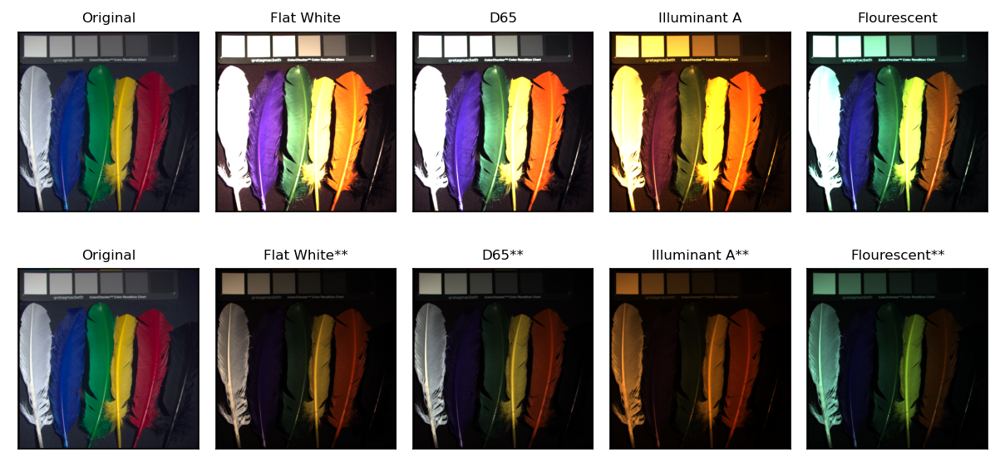

In [337]:
Compare_HS_rendition(16)

### Tiles

100%|████████████████████████████████████████████████████████████████████████████████| 512/512 [00:06<00:00, 73.86it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


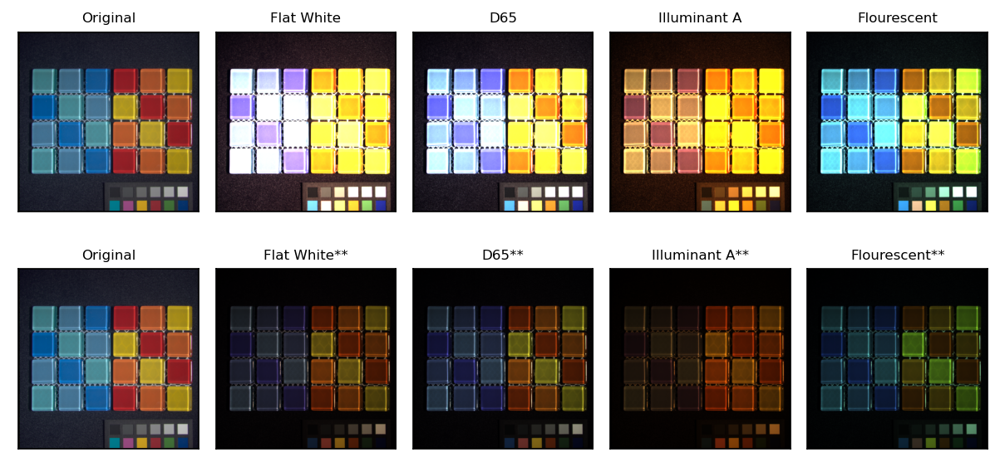

In [338]:
Compare_HS_rendition(18)

### Stuff Toy with Macbeth Chart

100%|████████████████████████████████████████████████████████████████████████████████| 512/512 [00:07<00:00, 70.83it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


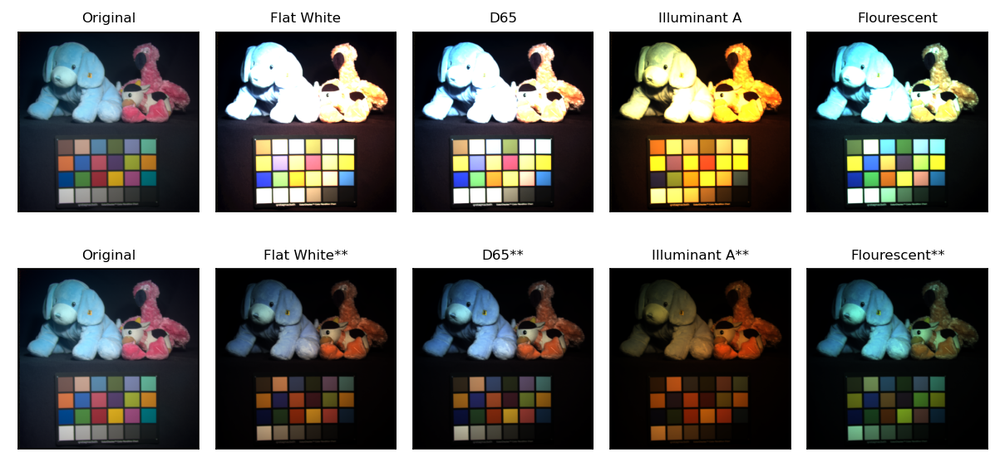

In [339]:
Compare_HS_rendition(28)

### Watercolor Painting

100%|████████████████████████████████████████████████████████████████████████████████| 512/512 [00:07<00:00, 72.10it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


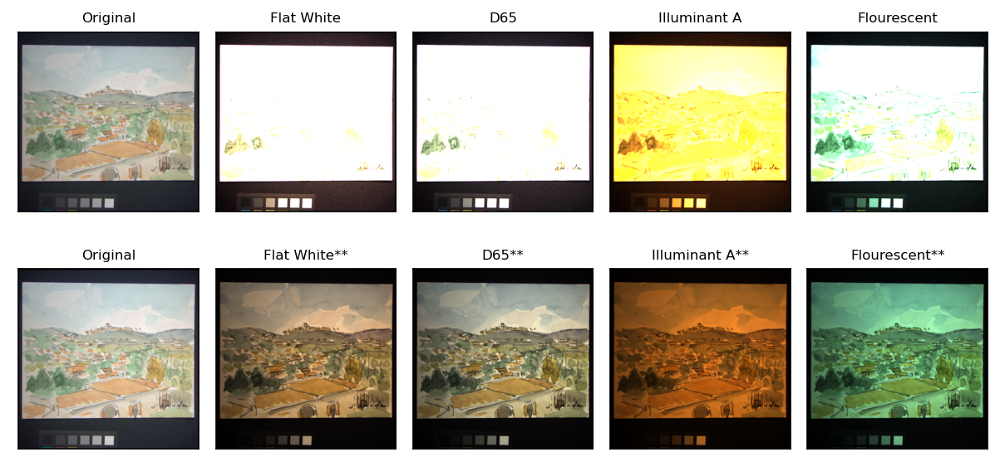

In [342]:
Compare_HS_rendition(31)

### Oil Painting

100%|████████████████████████████████████████████████████████████████████████████████| 512/512 [00:06<00:00, 73.19it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


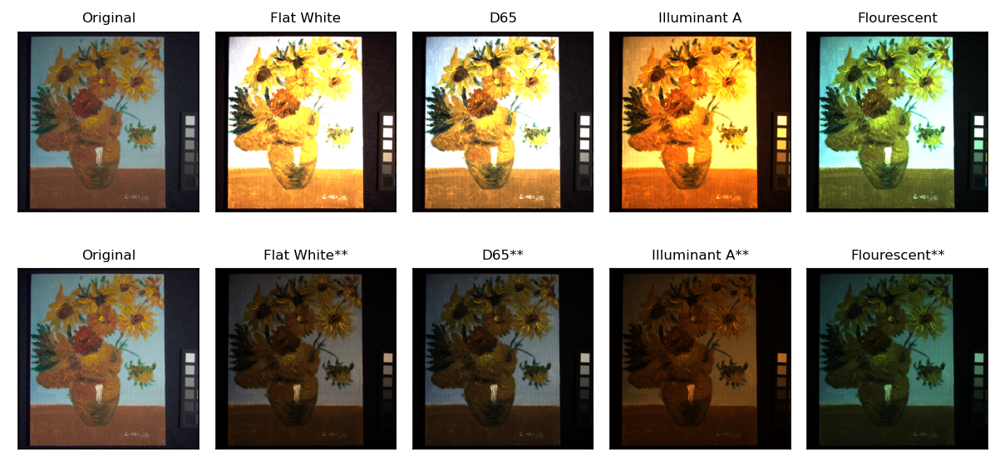

In [344]:
Compare_HS_rendition(21)